In [1]:
from pathlib import Path

import h5py
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.axes import Axes
from matplotlib.figure import Figure

from __future__ import annotations

import argparse
from collections.abc import Iterable
from dataclasses import dataclass
from pathlib import Path

from scipy.stats import pearsonr, spearmanr
import pandas as pd

In [2]:
def load_h5(filepath: str | Path, filename: str) -> dict[str, np.ndarray]:
    """
    Load all datasets from an HDF5 file.

    Parameters
    ----------
    filepath
        Directory containing the HDF5 file.

    filename
        Name of the HDF5 file, including the .h5 extension.

    Returns
    -------
    dict[str, np.ndarray]
        Dictionary containing all HDF5 datasets.

        The dictionary keys are the full dataset paths inside the
        HDF5 file. The values are NumPy arrays.

    Raises
    ------
    FileNotFoundError
        If the requested HDF5 file does not exist.

    OSError
        If the file exists but cannot be opened as an HDF5 file.
    """
    full_path = Path(filepath) / filename

    if not full_path.is_file():
        raise FileNotFoundError(
            f"HDF5 file was not found: {full_path.resolve()}"
        )

    data: dict[str, np.ndarray] = {}

    with h5py.File(full_path, mode="r") as h5_file:

        def load_dataset(name: str, obj: h5py.Dataset | h5py.Group) -> None:
            if isinstance(obj, h5py.Dataset):
                data[name] = obj[...]

        h5_file.visititems(load_dataset)

    return data

In [3]:
parent_dir = Path("/blue/bala1s/krishnap.kalivel/TLFHydrodynamics/thinfilm-closure-ml/datasets/BasC/param_space")

# case_names = [
#     "Re010_Ca0_010_theta45",
#     "Re010_Ca0_010_theta45_v2",
#     "Re020_Ca0_010_theta45",
#     "Re050_Ca0_010_theta45",
#     "Re120_Ca0_010_theta45",
# ]

case_names = [
    "Re010_Ca0_010_theta45_v2",
    "Re050_Ca0_010_theta45",
    "Re120_Ca0_010_theta45",
]

filename = "thinfilm_closure_data.h5"

all_closure_data = {}

for case_name in case_names:
    case_dir = parent_dir / case_name
    file_path = case_dir / filename

    if file_path.exists():
        all_closure_data[case_name] = load_h5(case_dir, filename)
        print(f"Loaded: {case_name}")
    else:
        print(f"Missing: {file_path}")

Loaded: Re010_Ca0_010_theta45_v2
Loaded: Re050_Ca0_010_theta45
Loaded: Re120_Ca0_010_theta45


In [4]:
for case_name, closure_data in all_closure_data.items():
    print(f"\n{case_name}")
    print("-" * len(case_name))

    for key, value in closure_data.items():
        print(f"  {key:<35} shape={value.shape}, dtype={value.dtype}")


Re010_Ca0_010_theta45_v2
------------------------
  dt                                  shape=(199,), dtype=float64
  h                                   shape=(16384, 199), dtype=float64
  h_m                                 shape=(16384, 199), dtype=float64
  h_x                                 shape=(16384, 199), dtype=float64
  h_xx                                shape=(16384, 199), dtype=float64
  parameters/Ca                       shape=(), dtype=float64
  parameters/Re                       shape=(), dtype=float64
  parameters/angle                    shape=(), dtype=float64
  parameters/h0                       shape=(), dtype=float64
  parameters/mu_ratio                 shape=(), dtype=float64
  parameters/rho_ratio                shape=(), dtype=float64
  parameters/t0                       shape=(), dtype=float64
  parameters/u0                       shape=(), dtype=float64
  q                                   shape=(16384, 199), dtype=float64
  q_m                      

In [5]:
def first_derivative_x(
    x: np.ndarray,
    field: np.ndarray,
) -> np.ndarray:
    """
    Compute the first derivative with respect to x for a field
    stored as (nx, nt).

    Fourth-order central differences are used in the interior.
    Fourth-order one-sided differences are used near the boundaries.

    Parameters
    ----------
    x : ndarray, shape (nx,)
        Uniformly spaced x coordinates.

    field : ndarray, shape (nx, nt)
        Field values. The first axis must correspond to x.

        Examples:
            h
            q
            tau_wall
            shape_factor

    Returns
    -------
    dfield_dx : ndarray, shape (nx, nt)
        Fourth-order approximation to df/dx at every time.
    """

    x = np.asarray(x, dtype=float)
    field = np.asarray(field, dtype=float)

    # --------------------------------------------------------
    # Validation
    # --------------------------------------------------------

    if x.ndim != 1:
        raise ValueError(
            "x must be a one-dimensional array."
        )

    if field.ndim != 2:
        raise ValueError(
            "field must have shape (nx, nt)."
        )

    if field.shape[0] != x.size:
        raise ValueError(
            "The first dimension of field must equal len(x). "
            f"Received field.shape={field.shape}, "
            f"len(x)={x.size}."
        )

    if x.size < 5:
        raise ValueError(
            "At least five x points are required for "
            "fourth-order differentiation."
        )

    dx_values = np.diff(x)
    dx = dx_values[0]

    if dx <= 0.0:
        raise ValueError(
            "x coordinates must increase monotonically."
        )

    if not np.allclose(dx_values, dx):
        raise ValueError(
            "The x grid must be uniformly spaced."
        )

    dfield_dx = np.empty_like(field, dtype=float)

    # --------------------------------------------------------
    # Interior
    # Fourth-order central difference
    # --------------------------------------------------------

    dfield_dx[2:-2, :] = (
        field[:-4, :]
        - 8.0 * field[1:-3, :]
        + 8.0 * field[3:-1, :]
        - field[4:, :]
    ) / (12.0 * dx)

    # --------------------------------------------------------
    # Left boundary
    # --------------------------------------------------------

    dfield_dx[0, :] = (
        -25.0 * field[0, :]
        + 48.0 * field[1, :]
        - 36.0 * field[2, :]
        + 16.0 * field[3, :]
        - 3.0 * field[4, :]
    ) / (12.0 * dx)

    dfield_dx[1, :] = (
        -3.0 * field[0, :]
        - 10.0 * field[1, :]
        + 18.0 * field[2, :]
        - 6.0 * field[3, :]
        + field[4, :]
    ) / (12.0 * dx)

    # --------------------------------------------------------
    # Right boundary
    # --------------------------------------------------------

    dfield_dx[-2, :] = (
        -field[-5, :]
        + 6.0 * field[-4, :]
        - 18.0 * field[-3, :]
        + 10.0 * field[-2, :]
        + 3.0 * field[-1, :]
    ) / (12.0 * dx)

    dfield_dx[-1, :] = (
        3.0 * field[-5, :]
        - 16.0 * field[-4, :]
        + 36.0 * field[-3, :]
        - 48.0 * field[-2, :]
        + 25.0 * field[-1, :]
    ) / (12.0 * dx)

    return dfield_dx

In [6]:
def second_derivative_x(
    x: np.ndarray,
    field: np.ndarray,
) -> np.ndarray:
    """
    Compute the second derivative with respect to x for a field
    stored as (nx, nt).

    Fourth-order central differences are used in the interior.
    Fourth-order one-sided differences are used near boundaries.

    Parameters
    ----------
    x : ndarray, shape (nx,)
        Uniformly spaced x coordinates.

    field : ndarray, shape (nx, nt)
        Field values. The first axis corresponds to x.

    Returns
    -------
    d2field_dx2 : ndarray, shape (nx, nt)
        Fourth-order approximation to d²f/dx².
    """

    x = np.asarray(x, dtype=float)
    field = np.asarray(field, dtype=float)

    # --------------------------------------------------------
    # Validation
    # --------------------------------------------------------

    if x.ndim != 1:
        raise ValueError(
            "x must be one-dimensional."
        )

    if field.ndim != 2:
        raise ValueError(
            "field must have shape (nx, nt)."
        )

    if field.shape[0] != x.size:
        raise ValueError(
            "The first dimension of field must equal len(x). "
            f"Received field.shape={field.shape}, "
            f"len(x)={x.size}."
        )

    if x.size < 6:
        raise ValueError(
            "At least six x points are required."
        )

    dx_values = np.diff(x)
    dx = dx_values[0]

    if dx <= 0.0:
        raise ValueError(
            "x coordinates must increase monotonically."
        )

    if not np.allclose(dx_values, dx):
        raise ValueError(
            "The x grid must be uniformly spaced."
        )

    d2field_dx2 = np.empty_like(
        field,
        dtype=float,
    )

    # --------------------------------------------------------
    # Interior
    # --------------------------------------------------------

    d2field_dx2[2:-2, :] = (
        -field[4:, :]
        + 16.0 * field[3:-1, :]
        - 30.0 * field[2:-2, :]
        + 16.0 * field[1:-3, :]
        - field[:-4, :]
    ) / (12.0 * dx**2)

    # --------------------------------------------------------
    # Left boundary
    # --------------------------------------------------------

    d2field_dx2[0, :] = (
        45.0 * field[0, :]
        - 154.0 * field[1, :]
        + 214.0 * field[2, :]
        - 156.0 * field[3, :]
        + 61.0 * field[4, :]
        - 10.0 * field[5, :]
    ) / (12.0 * dx**2)

    d2field_dx2[1, :] = (
        10.0 * field[0, :]
        - 15.0 * field[1, :]
        - 4.0 * field[2, :]
        + 14.0 * field[3, :]
        - 6.0 * field[4, :]
        + field[5, :]
    ) / (12.0 * dx**2)

    # --------------------------------------------------------
    # Right boundary
    # --------------------------------------------------------

    d2field_dx2[-2, :] = (
        field[-6, :]
        - 6.0 * field[-5, :]
        + 14.0 * field[-4, :]
        - 4.0 * field[-3, :]
        - 15.0 * field[-2, :]
        + 10.0 * field[-1, :]
    ) / (12.0 * dx**2)

    d2field_dx2[-1, :] = (
        -10.0 * field[-6, :]
        + 61.0 * field[-5, :]
        - 156.0 * field[-4, :]
        + 214.0 * field[-3, :]
        - 154.0 * field[-2, :]
        + 45.0 * field[-1, :]
    ) / (12.0 * dx**2)

    return d2field_dx2

In [7]:
def first_derivative_t(
    field: np.ndarray,
    field_minus: np.ndarray,
    time: np.ndarray,
    time_minus: np.ndarray,
) -> np.ndarray:
    """
    Compute first-order backward time derivatives for a field
    stored as (nx, nt).

    Each current snapshot has a corresponding previous snapshot:

        df/dt[:, j] =
            (field[:, j] - field_minus[:, j])
            / (time[j] - time_minus[j])

    Parameters
    ----------
    field : ndarray, shape (nx, nt)
        Quantity at the current snapshot times.

    field_minus : ndarray, shape (nx, nt)
        Same quantity at the corresponding previous times.

    time : ndarray, shape (nt,)
        Current snapshot times.

    time_minus : ndarray, shape (nt,)
        Previous snapshot times.

    Returns
    -------
    dfield_dt : ndarray, shape (nx, nt)
        First-order approximation to df/dt.
    """

    field = np.asarray(field, dtype=float)
    field_minus = np.asarray(field_minus, dtype=float)

    time = np.asarray(time, dtype=float)
    time_minus = np.asarray(time_minus, dtype=float)

    # --------------------------------------------------------
    # Validation
    # --------------------------------------------------------

    if field.ndim != 2:
        raise ValueError(
            "field must have shape (nx, nt)."
        )

    if field_minus.ndim != 2:
        raise ValueError(
            "field_minus must have shape (nx, nt)."
        )

    if field.shape != field_minus.shape:
        raise ValueError(
            "field and field_minus must have identical shapes. "
            f"Received {field.shape} and {field_minus.shape}."
        )

    if time.ndim != 1 or time_minus.ndim != 1:
        raise ValueError(
            "time and time_minus must be one-dimensional."
        )

    if time.shape != time_minus.shape:
        raise ValueError(
            "time and time_minus must have identical shapes."
        )

    if field.shape[1] != time.size:
        raise ValueError(
            "The second dimension of field must match "
            "the number of time values. "
            f"Received field.shape={field.shape}, "
            f"time.size={time.size}."
        )

    dt = time - time_minus

    if np.any(dt <= 0.0):
        bad_indices = np.where(dt <= 0.0)[0]

        raise ValueError(
            "All time values must be greater than their "
            "corresponding time_minus values. "
            f"Bad indices: {bad_indices[:10]}"
        )

    # dt has shape (nt,)
    #
    # field has shape (nx, nt)
    #
    # NumPy broadcasts dt across the x dimension.

    dfield_dt = (
        field - field_minus
    ) / dt[np.newaxis, :]

    return dfield_dt

Interface plots for all cases

In [8]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

In [9]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import numpy as np
import matplotlib.pyplot as plt

n_animation_frames = 50

fig, ax = plt.subplots(
    len(case_names),
    1,
    figsize=(12, 12),
    constrained_layout=True
)

# Make ax iterable even if there is only one case
ax = np.atleast_1d(ax)

lines = []
time_texts = []

# ---------------------------------------------------------
# Global animation time
# ---------------------------------------------------------
t_start = min(all_closure_data[case]["t"][0] for case in case_names)
t_end = max(all_closure_data[case]["t"][-1] for case in case_names)

animation_times = np.linspace(t_start, t_end, n_animation_frames)

# ---------------------------------------------------------
# Initialize plots
# ---------------------------------------------------------
for i, case_name in enumerate(case_names):

    data = all_closure_data[case_name]

    x_case = data["x"]
    h_case = data["h"]
    t_case = data["t"]

    line, = ax[i].plot(x_case, h_case[:, 0])
    lines.append(line)

    time_text = ax[i].text(
        0.02,
        0.88,
        "",
        transform=ax[i].transAxes
    )
    time_texts.append(time_text)

    ax[i].set_title(case_name)
    ax[i].set_ylabel(r"$h$")
    ax[i].grid(True)

    ax[i].set_xlim(x_case.min(), x_case.max())
    ax[i].set_ylim(0.2, 2.5)

ax[-1].set_xlabel(r"$x/h_0$")


# ---------------------------------------------------------
# Animation update
# ---------------------------------------------------------
def update(frame):

    current_time = animation_times[frame]

    for i, case_name in enumerate(case_names):

        data = all_closure_data[case_name]

        h_case = data["h"]
        t_case = data["t"]

        # Find snapshot closest to current global time
        local_frame = np.searchsorted(t_case, current_time)

        # Prevent going past the last available snapshot
        local_frame = min(local_frame, len(t_case) - 1)

        lines[i].set_ydata(h_case[:, local_frame])

        time_texts[i].set_text(
            fr"$t={t_case[local_frame]:.2f}$"
        )

    return lines + time_texts


ani = FuncAnimation(
    fig,
    update,
    frames=n_animation_frames,
    interval=150,
    blit=False
)

plt.close(fig)

HTML(ani.to_jshtml())

In [10]:
for case_name, data in all_closure_data.items():
    t_case = data["t"]

    print(f"{case_name:<30} t_max = {np.max(t_case):10.4f}    snapshots = {len(t_case)}")

Re010_Ca0_010_theta45_v2       t_max =  1990.0000    snapshots = 199
Re050_Ca0_010_theta45          t_max =  1060.0000    snapshots = 106
Re120_Ca0_010_theta45          t_max =   240.0000    snapshots = 24


In [11]:
correlation_results = {}

for case_name, data in all_closure_data.items():

    h = data["h"]
    h_m = data["h_m"]
    h_x = data["h_x"]
    h_xx = data["h_xx"]

    q = data["q"]
    q_m = data["q_m"]
    q_x = data["q_x"]
    q_xx = data["q_xx"]

    tau_w = data["tau_wall"]
    dt = data["dt"]

    h_t = (h - h_m) / dt[None, :]
    q_t = (q - q_m) / dt[None, :]

    tau_w_correction = tau_w - 3.0 * q / h**2

    variables = {
        "h": h,
        "q": q,
        "h_x": h_x,
        "q_x": q_x,
        "h_xx": h_xx,
        "q_xx": q_xx,
        "h_t": h_t,
        "q_t": q_t,
    }

    pearson_values = {}
    spearman_values = {}

    correction_flat = tau_w_correction.ravel()

    for variable_name, variable in variables.items():

        variable_flat = variable.ravel()

        valid = np.isfinite(correction_flat) & np.isfinite(variable_flat)

        x_valid = variable_flat[valid]
        y_valid = correction_flat[valid]

        pearson_values[variable_name] = pearsonr(x_valid, y_valid).statistic
        spearman_values[variable_name] = spearmanr(x_valid, y_valid).statistic

    correlation_results[case_name] = {
        "pearson": pearson_values,
        "spearman": spearman_values,
    }

In [12]:
variable_names = ["h", "q", "h_x", "q_x", "h_xx", "q_xx", "h_t", "q_t"]
case_names = list(all_closure_data.keys())

pearson_matrix = np.array([[correlation_results[case]["pearson"][var] for var in variable_names] for case in case_names])
spearman_matrix = np.array([[correlation_results[case]["spearman"][var] for var in variable_names] for case in case_names])

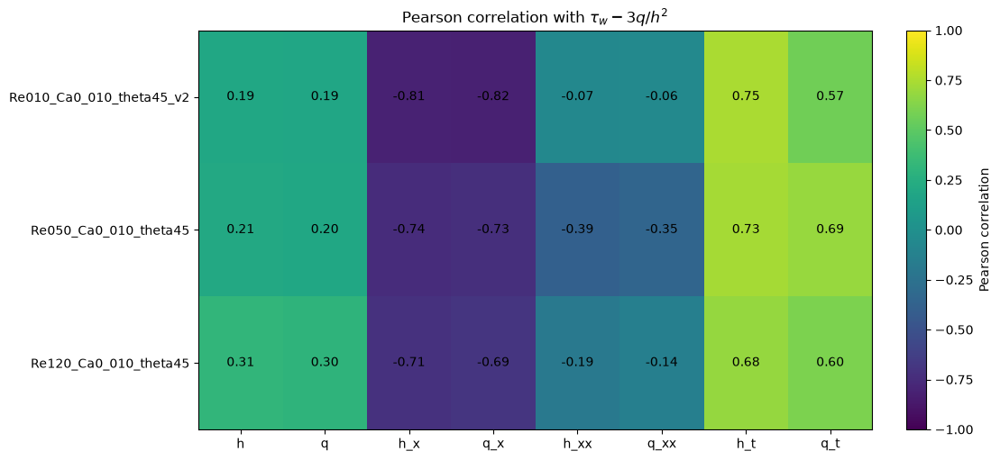

In [13]:
fig, ax = plt.subplots(figsize=(11, 5), constrained_layout=True)

im = ax.imshow(pearson_matrix, vmin=-1, vmax=1, aspect="auto")

ax.set_xticks(np.arange(len(variable_names)))
ax.set_xticklabels(variable_names)

ax.set_yticks(np.arange(len(case_names)))
ax.set_yticklabels(case_names)

ax.set_title(r"Pearson correlation with $\tau_w - 3q/h^2$")

for i in range(len(case_names)):
    for j in range(len(variable_names)):
        ax.text(j, i, f"{pearson_matrix[i, j]:.2f}", ha="center", va="center")

fig.colorbar(im, ax=ax, label="Pearson correlation")

plt.show()

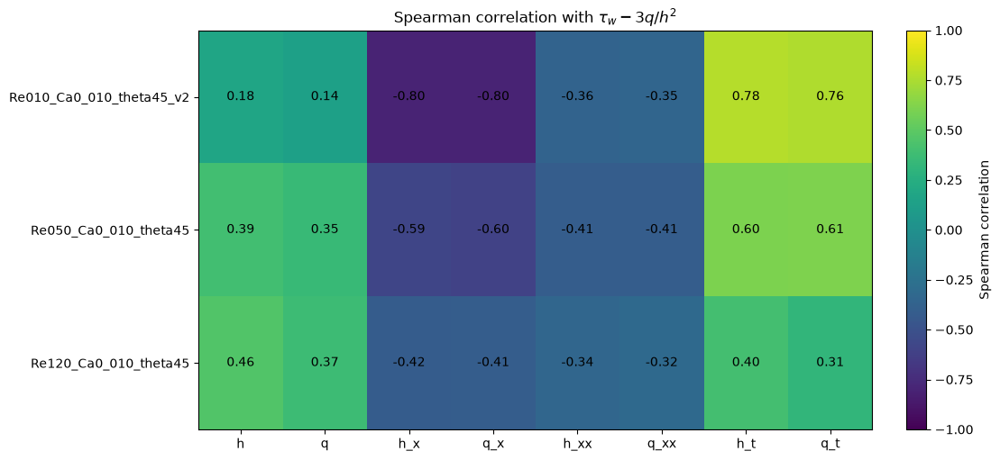

In [14]:
fig, ax = plt.subplots(figsize=(11, 5), constrained_layout=True)

im = ax.imshow(spearman_matrix, vmin=-1, vmax=1, aspect="auto")

ax.set_xticks(np.arange(len(variable_names)))
ax.set_xticklabels(variable_names)

ax.set_yticks(np.arange(len(case_names)))
ax.set_yticklabels(case_names)

ax.set_title(r"Spearman correlation with $\tau_w - 3q/h^2$")

for i in range(len(case_names)):
    for j in range(len(variable_names)):
        ax.text(j, i, f"{spearman_matrix[i, j]:.2f}", ha="center", va="center")

fig.colorbar(im, ax=ax, label="Spearman correlation")

plt.show()

Early undisturbed film data might be biasing our correlations. So, I am adding a mask to get rid of the undeveloped film regions

In [15]:
h_mean = 1.0
h_tolerance = 0.1

analysis_masks = {}

for case_name, data in all_closure_data.items():

    x_case = data["x"]
    h_case = data["h"]
    t_case = data["t"]

    nx, nt = h_case.shape

    analysis_mask = np.zeros((nx, nt), dtype=bool)

    for j in range(nt):

        h_snapshot = h_case[:, j]

        flat = np.abs(h_snapshot - h_mean) <= h_tolerance
        disturbed = ~flat

        disturbed_indices = np.where(disturbed)[0]

        if disturbed_indices.size == 0:
            continue

        last_disturbed_index = disturbed_indices[-1]

        analysis_mask[:last_disturbed_index + 1, j] = True

    analysis_masks[case_name] = analysis_mask

    retained = np.sum(analysis_mask)
    total = analysis_mask.size

    print(f"{case_name:<30} retained = {retained / total * 100:.2f}%")

Re010_Ca0_010_theta45_v2       retained = 93.83%
Re050_Ca0_010_theta45          retained = 84.83%
Re120_Ca0_010_theta45          retained = 30.06%


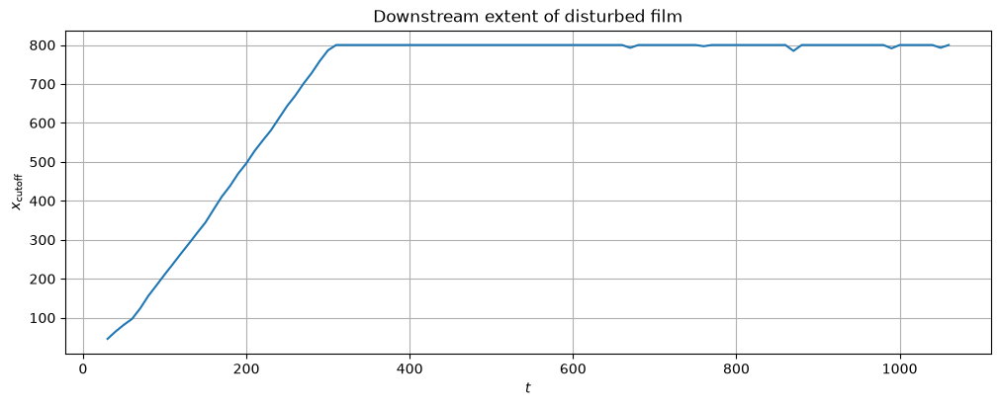

In [16]:
case_name = "Re050_Ca0_010_theta45"

data = all_closure_data[case_name]

x_case = data["x"]
h_case = data["h"]
t_case = data["t"]

mask = analysis_masks[case_name]

x_cutoff = np.full(len(t_case), np.nan)

for j in range(len(t_case)):

    retained_indices = np.where(mask[:, j])[0]

    if retained_indices.size > 0:
        x_cutoff[j] = x_case[retained_indices[-1]]

fig, ax = plt.subplots(figsize=(10, 4), constrained_layout=True)

ax.plot(t_case, x_cutoff)

ax.set_xlabel(r"$t$")
ax.set_ylabel(r"$x_{\mathrm{cutoff}}$")
ax.set_title("Downstream extent of disturbed film")
ax.grid(True)

plt.show()

Pearson and Spearman coefficients for the wall friction correction
Initial judgement of correlations

In [17]:
correlation_results = {}

for case_name, data in all_closure_data.items():

    h = data["h"]
    h_m = data["h_m"]
    h_x = data["h_x"]
    h_xx = data["h_xx"]

    q = data["q"]
    q_m = data["q_m"]
    q_x = data["q_x"]
    q_xx = data["q_xx"]

    tau_w = data["tau_wall"]
    dt = data["dt"]

    h_t = (h - h_m) / dt[None, :]
    q_t = (q - q_m) / dt[None, :]

    tau_w_correction = tau_w - 3.0 * q / h**2

    variables = {
        "h": h,
        "q": q,
        "h_x": h_x,
        "q_x": q_x,
        "h_xx": h_xx,
        "q_xx": q_xx,
        "h_t": h_t,
        "q_t": q_t,
    }

    analysis_mask = analysis_masks[case_name]

    correction_masked = tau_w_correction[analysis_mask]

    pearson_values = {}
    spearman_values = {}

    for variable_name, variable in variables.items():

        variable_masked = variable[analysis_mask]

        valid = np.isfinite(correction_masked)
        valid &= np.isfinite(variable_masked)

        x_valid = variable_masked[valid]
        y_valid = correction_masked[valid]

        pearson_values[variable_name] = pearsonr(x_valid, y_valid).statistic
        spearman_values[variable_name] = spearmanr(x_valid, y_valid).statistic

    correlation_results[case_name] = {
        "pearson": pearson_values,
        "spearman": spearman_values,
    }

In [18]:
variable_names = ["h", "q", "h_x", "q_x", "h_xx", "q_xx", "h_t", "q_t"]
case_names = list(all_closure_data.keys())

pearson_matrix = np.array([[correlation_results[case]["pearson"][var] for var in variable_names] for case in case_names])
spearman_matrix = np.array([[correlation_results[case]["spearman"][var] for var in variable_names] for case in case_names])

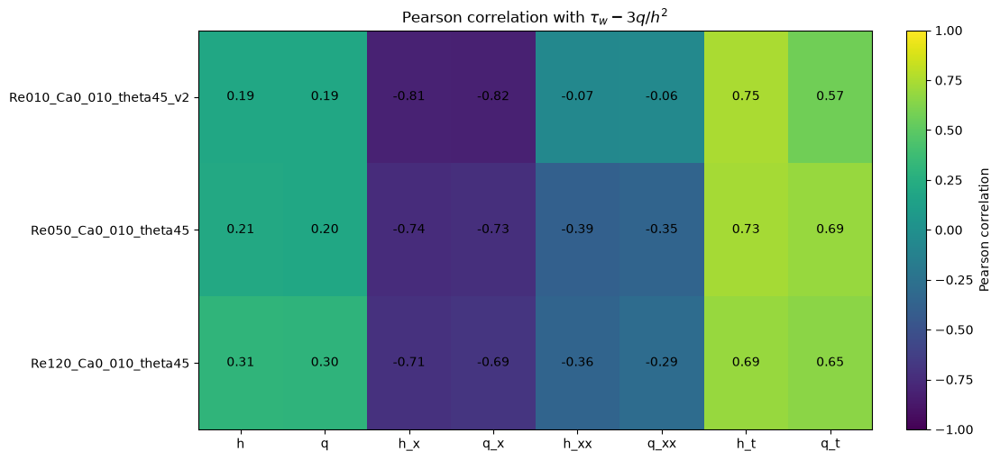

In [19]:
fig, ax = plt.subplots(figsize=(11, 5), constrained_layout=True)

im = ax.imshow(pearson_matrix, vmin=-1, vmax=1, aspect="auto")

ax.set_xticks(np.arange(len(variable_names)))
ax.set_xticklabels(variable_names)

ax.set_yticks(np.arange(len(case_names)))
ax.set_yticklabels(case_names)

ax.set_title(r"Pearson correlation with $\tau_w - 3q/h^2$")

for i in range(len(case_names)):
    for j in range(len(variable_names)):
        ax.text(j, i, f"{pearson_matrix[i, j]:.2f}", ha="center", va="center")

fig.colorbar(im, ax=ax, label="Pearson correlation")

plt.show()

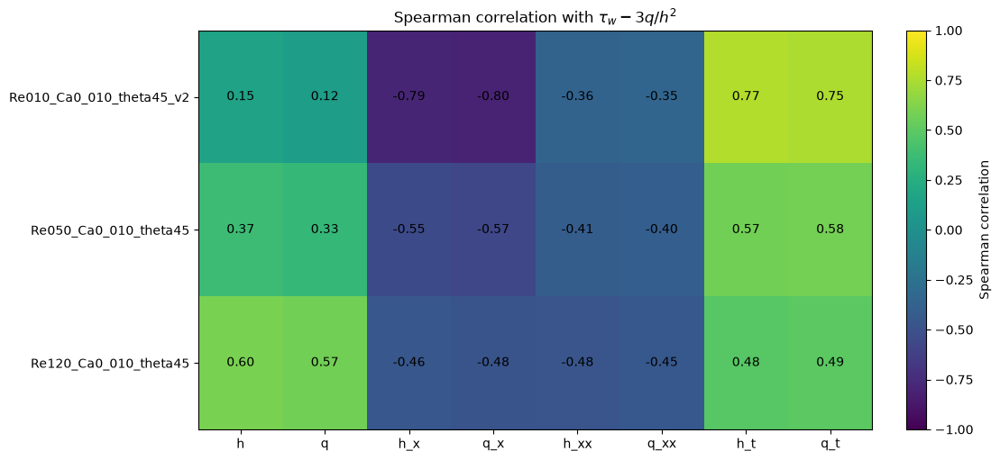

In [20]:
fig, ax = plt.subplots(figsize=(11, 5), constrained_layout=True)

im = ax.imshow(spearman_matrix, vmin=-1, vmax=1, aspect="auto")

ax.set_xticks(np.arange(len(variable_names)))
ax.set_xticklabels(variable_names)

ax.set_yticks(np.arange(len(case_names)))
ax.set_yticklabels(case_names)

ax.set_title(r"Spearman correlation with $\tau_w - 3q/h^2$")

for i in range(len(case_names)):
    for j in range(len(variable_names)):
        ax.text(j, i, f"{spearman_matrix[i, j]:.2f}", ha="center", va="center")

fig.colorbar(im, ax=ax, label="Spearman correlation")

plt.show()

In [21]:
combined_variables = {name: [] for name in variable_names}
combined_correction = []

for case_name, data in all_closure_data.items():

    h = data["h"]
    h_m = data["h_m"]
    h_x = data["h_x"]
    h_xx = data["h_xx"]

    q = data["q"]
    q_m = data["q_m"]
    q_x = data["q_x"]
    q_xx = data["q_xx"]

    tau_w = data["tau_wall"]
    dt = data["dt"]

    h_t = (h - h_m) / dt[None, :]
    q_t = (q - q_m) / dt[None, :]

    tau_w_correction = tau_w - 3.0 * q / h**2

    combined_correction.append(tau_w_correction.ravel())

    combined_variables["h"].append(h.ravel())
    combined_variables["q"].append(q.ravel())
    combined_variables["h_x"].append(h_x.ravel())
    combined_variables["q_x"].append(q_x.ravel())
    combined_variables["h_xx"].append(h_xx.ravel())
    combined_variables["q_xx"].append(q_xx.ravel())
    combined_variables["h_t"].append(h_t.ravel())
    combined_variables["q_t"].append(q_t.ravel())

combined_correction = np.concatenate(combined_correction)

for name in variable_names:
    combined_variables[name] = np.concatenate(combined_variables[name])

In [22]:
combined_pearson = []
combined_spearman = []

for variable_name in variable_names:

    variable = combined_variables[variable_name]

    valid = np.isfinite(variable) & np.isfinite(combined_correction)

    x_valid = variable[valid]
    y_valid = combined_correction[valid]

    combined_pearson.append(pearsonr(x_valid, y_valid).statistic)
    combined_spearman.append(spearmanr(x_valid, y_valid).statistic)

combined_pearson = np.array(combined_pearson)
combined_spearman = np.array(combined_spearman)

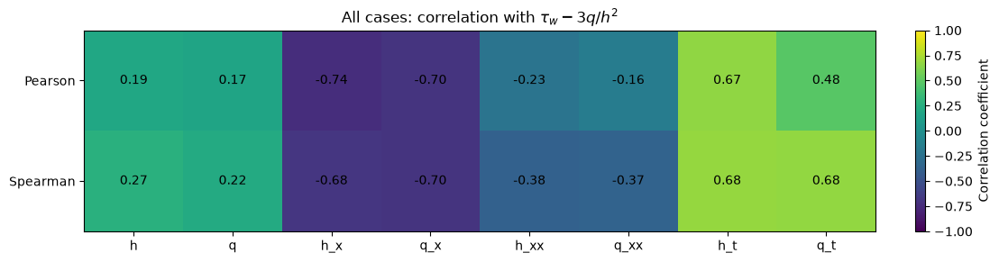

In [23]:
combined_matrix = np.vstack([combined_pearson, combined_spearman])

fig, ax = plt.subplots(figsize=(11, 2.8), constrained_layout=True)

im = ax.imshow(combined_matrix, vmin=-1, vmax=1, aspect="auto")

ax.set_xticks(np.arange(len(variable_names)))
ax.set_xticklabels(variable_names)

ax.set_yticks([0, 1])
ax.set_yticklabels(["Pearson", "Spearman"])

ax.set_title(r"All cases: correlation with $\tau_w - 3q/h^2$")

for i in range(2):
    for j in range(len(variable_names)):
        ax.text(j, i, f"{combined_matrix[i, j]:.2f}", ha="center", va="center")

fig.colorbar(im, ax=ax, label="Correlation coefficient")

plt.show()

In [24]:
correlation_results = {}

for case_name, data in all_closure_data.items():

    h = data["h"]
    h_m = data["h_m"]
    h_x = data["h_x"]
    h_xx = data["h_xx"]

    q = data["q"]
    q_m = data["q_m"]
    q_x = data["q_x"]
    q_xx = data["q_xx"]

    tau_w = data["tau_wall"]
    dt = data["dt"]

    h_t = (h - h_m) / dt[None, :]
    q_t = (q - q_m) / dt[None, :]

    tau_w_correction = tau_w

    variables = {
        "h": h,
        "q": q,
        "h_x": h_x,
        "q_x": q_x,
        "h_xx": h_xx,
        "q_xx": q_xx,
        "h_t": h_t,
        "q_t": q_t,
    }

    analysis_mask = analysis_masks[case_name]

    correction_masked = tau_w_correction[analysis_mask]

    pearson_values = {}
    spearman_values = {}

    for variable_name, variable in variables.items():

        variable_masked = variable[analysis_mask]

        valid = np.isfinite(correction_masked)
        valid &= np.isfinite(variable_masked)

        x_valid = variable_masked[valid]
        y_valid = correction_masked[valid]

        pearson_values[variable_name] = pearsonr(x_valid, y_valid).statistic
        spearman_values[variable_name] = spearmanr(x_valid, y_valid).statistic

    correlation_results[case_name] = {
        "pearson": pearson_values,
        "spearman": spearman_values,
    }

In [25]:
variable_names = ["h", "q", "h_x", "q_x", "h_xx", "q_xx", "h_t", "q_t"]
case_names = list(all_closure_data.keys())

pearson_matrix = np.array([[correlation_results[case]["pearson"][var] for var in variable_names] for case in case_names])
spearman_matrix = np.array([[correlation_results[case]["spearman"][var] for var in variable_names] for case in case_names])

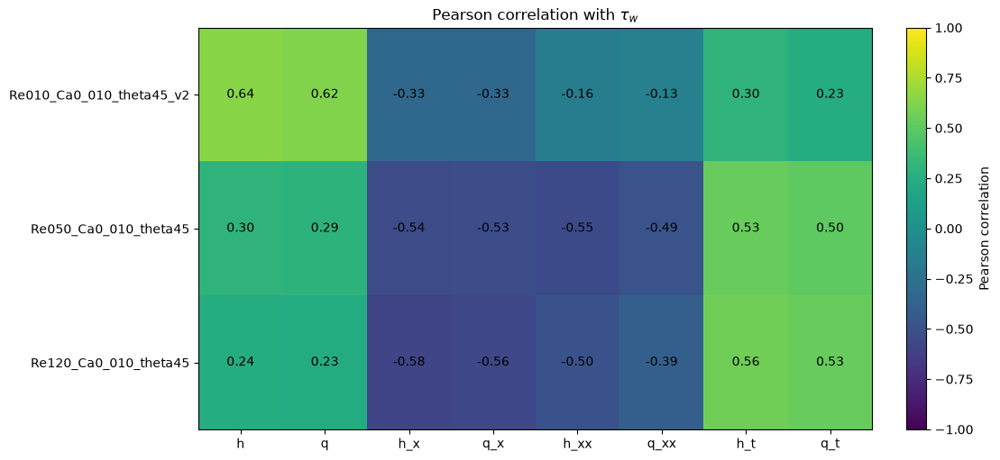

In [26]:
fig, ax = plt.subplots(figsize=(11, 5), constrained_layout=True)

im = ax.imshow(pearson_matrix, vmin=-1, vmax=1, aspect="auto")

ax.set_xticks(np.arange(len(variable_names)))
ax.set_xticklabels(variable_names)

ax.set_yticks(np.arange(len(case_names)))
ax.set_yticklabels(case_names)

ax.set_title(r"Pearson correlation with $\tau_w$")

for i in range(len(case_names)):
    for j in range(len(variable_names)):
        ax.text(j, i, f"{pearson_matrix[i, j]:.2f}", ha="center", va="center")

fig.colorbar(im, ax=ax, label="Pearson correlation")

plt.show()

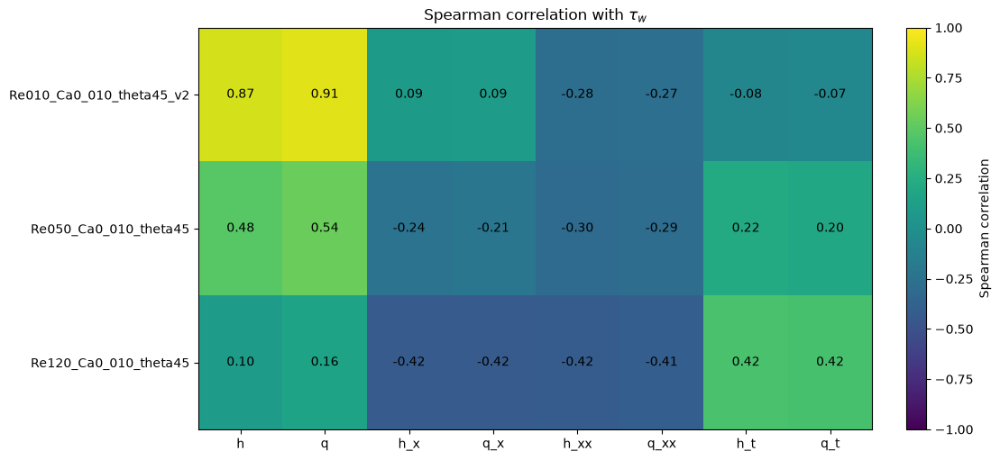

In [27]:
fig, ax = plt.subplots(figsize=(11, 5), constrained_layout=True)

im = ax.imshow(spearman_matrix, vmin=-1, vmax=1, aspect="auto")

ax.set_xticks(np.arange(len(variable_names)))
ax.set_xticklabels(variable_names)

ax.set_yticks(np.arange(len(case_names)))
ax.set_yticklabels(case_names)

ax.set_title(r"Spearman correlation with $\tau_w$")

for i in range(len(case_names)):
    for j in range(len(variable_names)):
        ax.text(j, i, f"{spearman_matrix[i, j]:.2f}", ha="center", va="center")

fig.colorbar(im, ax=ax, label="Spearman correlation")

plt.show()

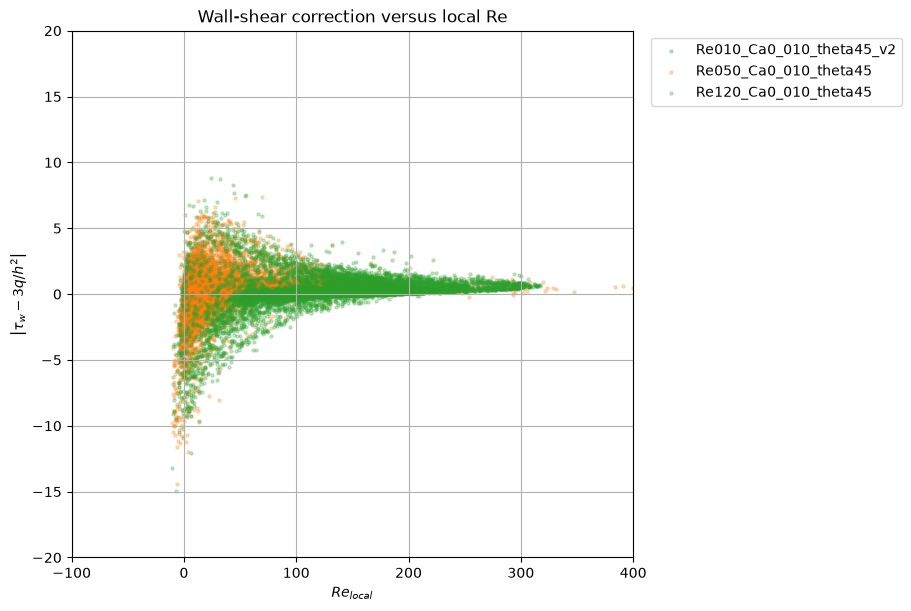

In [28]:
sample_size_per_case = 20000
rng = np.random.default_rng(42)

fig, ax = plt.subplots(figsize=(9, 6), constrained_layout=True)

for case_name, data in all_closure_data.items():

    q = data["q"]
    h = data["h"]
    tau_w = data["tau_wall"]
    Re_case = float(data["parameters/Re"])
    Re_local = Re_case * q

    analysis_mask = analysis_masks[case_name]

    tau_w_correction = tau_w - 3.0 * q / h**2
    # tau_w_error = np.abs(tau_w_correction)
    tau_w_error = tau_w_correction

    Re_substitute = Re_local[analysis_mask]
    tau_w_error = tau_w_error[analysis_mask]

    valid = np.isfinite(Re_substitute) & np.isfinite(tau_w_error)

    Re_substitute = Re_substitute[valid]
    tau_w_error = tau_w_error[valid]

    if len(Re_substitute) > sample_size_per_case:
        idx = rng.choice(len(Re_substitute), sample_size_per_case, replace=False)
        Re_plot = Re_substitute[idx]
        error_plot = tau_w_error[idx]
    else:
        Re_plot = Re_substitute
        error_plot = tau_w_error

    ax.scatter(Re_plot, error_plot, s=5, alpha=0.25, label=case_name)

ax.set_xlabel(r"$Re_{local}$")
ax.set_ylabel(r"$\left|\tau_w - 3q/h^2\right|$")
ax.set_title("Wall-shear correction versus local Re")
ax.set_ylim((-20, 20))
ax.set_xlim((-100, 400))
ax.grid(True)

ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left")

plt.show()

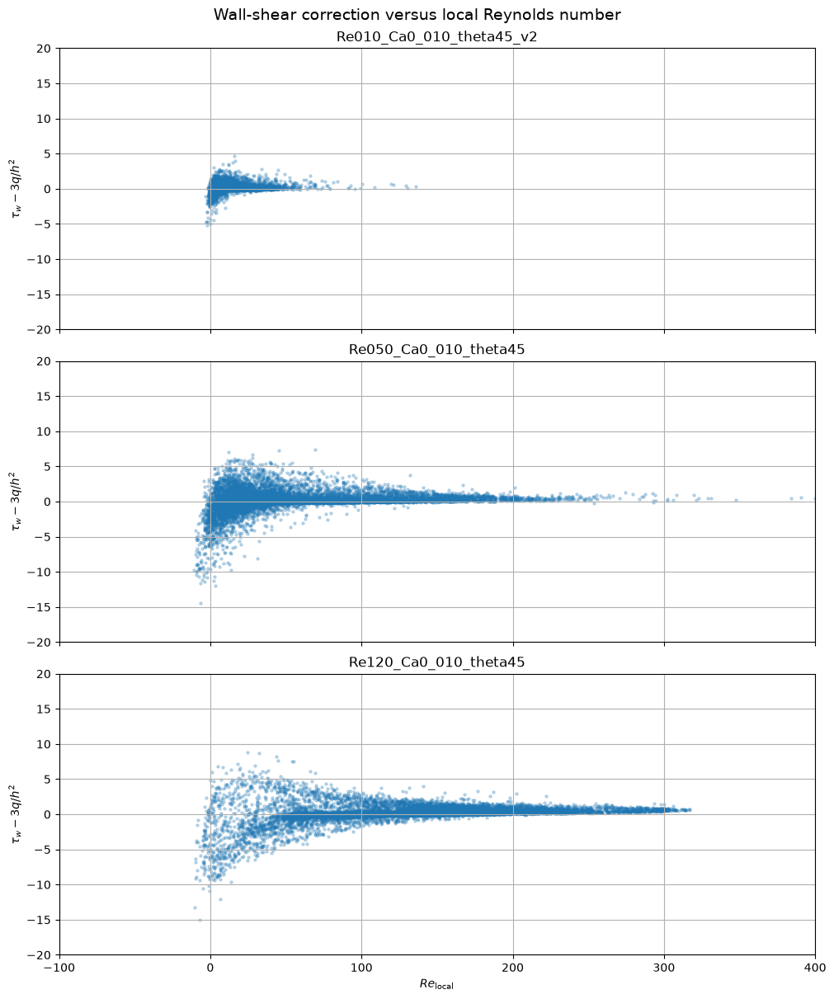

In [29]:
sample_size_per_case = 20000
rng = np.random.default_rng(42)

n_cases = len(all_closure_data)

fig, ax = plt.subplots(n_cases, 1, figsize=(10, 12), sharex=True, sharey=True, constrained_layout=True)

for i, (case_name, data) in enumerate(all_closure_data.items()):

    q = data["q"]
    h = data["h"]
    tau_w = data["tau_wall"]

    Re_case = float(data["parameters/Re"])
    Re_local = Re_case * q

    analysis_mask = analysis_masks[case_name]

    tau_w_correction = tau_w - 3.0 * q / h**2

    Re_local_masked = Re_local[analysis_mask]
    tau_w_correction_masked = tau_w_correction[analysis_mask]

    valid = np.isfinite(Re_local_masked) & np.isfinite(tau_w_correction_masked)

    Re_local_masked = Re_local_masked[valid]
    tau_w_correction_masked = tau_w_correction_masked[valid]

    if len(Re_local_masked) > sample_size_per_case:
        idx = rng.choice(len(Re_local_masked), sample_size_per_case, replace=False)
        Re_plot = Re_local_masked[idx]
        correction_plot = tau_w_correction_masked[idx]
    else:
        Re_plot = Re_local_masked
        correction_plot = tau_w_correction_masked

    ax[i].scatter(Re_plot, correction_plot, s=5, alpha=0.25)

    ax[i].set_title(case_name)
    ax[i].set_ylabel(r"$\tau_w - 3q/h^2$")
    ax[i].set_ylim(-20, 20)
    ax[i].set_xlim(-100, 400)
    ax[i].grid(True)

ax[-1].set_xlabel(r"$Re_{\mathrm{local}}$")

fig.suptitle("Wall-shear correction versus local Reynolds number", fontsize=14)

plt.show()

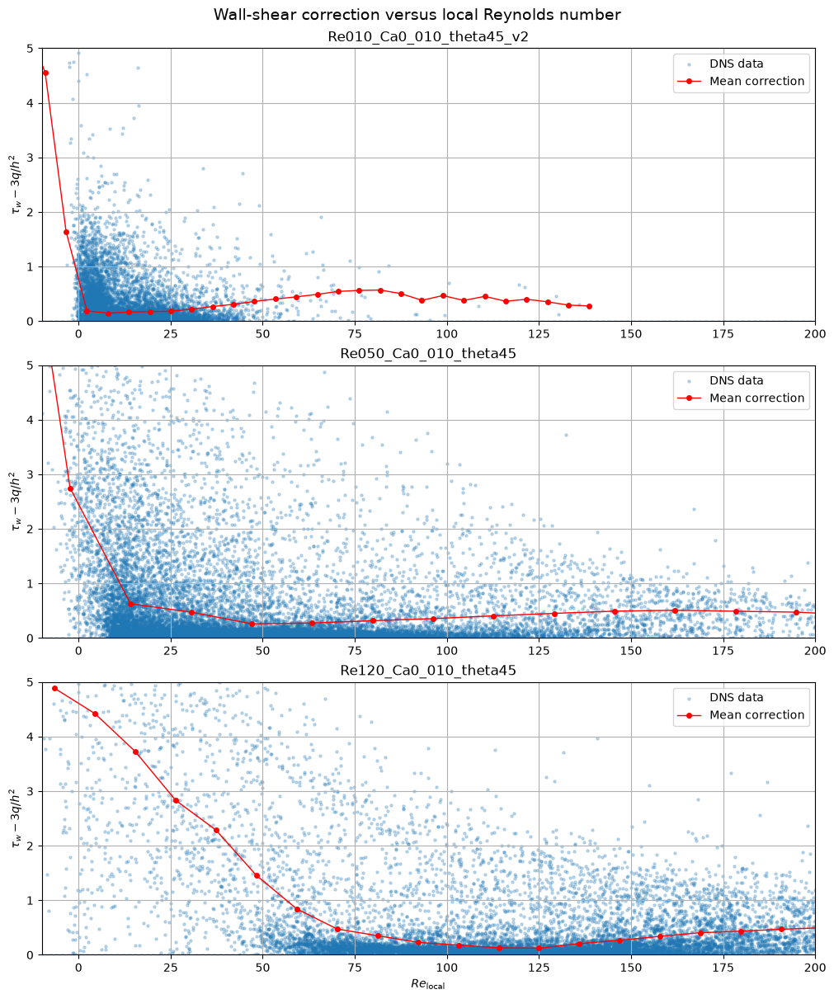

In [30]:
sample_size_per_case = 20000
n_bins = 30
rng = np.random.default_rng(42)

n_cases = len(all_closure_data)

fig, ax = plt.subplots(n_cases, 1, figsize=(10, 12), sharex=False, sharey=True, constrained_layout=True)

for i, (case_name, data) in enumerate(all_closure_data.items()):

    q = data["q"]
    h = data["h"]
    tau_w = data["tau_wall"]

    Re_case = float(data["parameters/Re"])
    Re_local = Re_case * q

    analysis_mask = analysis_masks[case_name]

    tau_w_correction = tau_w - 3.0 * q / h**2

    Re_local_masked = Re_local[analysis_mask]
    tau_w_correction_masked = np.abs(tau_w_correction[analysis_mask])

    valid = np.isfinite(Re_local_masked) & np.isfinite(tau_w_correction_masked)

    Re_local_masked = Re_local_masked[valid]
    tau_w_correction_masked = tau_w_correction_masked[valid]

    # Random subsample for scatter plot
    if len(Re_local_masked) > sample_size_per_case:
        idx = rng.choice(len(Re_local_masked), sample_size_per_case, replace=False)
        Re_plot = Re_local_masked[idx]
        correction_plot = tau_w_correction_masked[idx]
    else:
        Re_plot = Re_local_masked
        correction_plot = tau_w_correction_masked

    ax[i].scatter(Re_plot, correction_plot, s=5, alpha=0.25, label="DNS data")

    # --------------------------------------------------------
    # Bin by local Reynolds number
    # --------------------------------------------------------

    bin_edges = np.linspace(np.min(Re_local_masked), np.max(Re_local_masked), n_bins + 1)

    bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

    mean_correction = np.full(n_bins, np.nan)

    for j in range(n_bins):
        bin_mask = (Re_local_masked >= bin_edges[j]) & (Re_local_masked < bin_edges[j + 1])

        if np.any(bin_mask):
            mean_correction[j] = np.mean(tau_w_correction_masked[bin_mask])

    # Plot mean correction
    ax[i].plot(bin_centers, mean_correction, linewidth=1, marker="o", markersize=4, label="Mean correction",color="red")

    # Zero correction reference
    ax[i].axhline(0.0, linestyle="--", linewidth=1)

    ax[i].set_title(case_name)
    ax[i].set_ylabel(r"$\tau_w - 3q/h^2$")
    ax[i].set_ylim(0, 5)
    ax[i].set_xlim(-10, 200)
    ax[i].grid(True)
    ax[i].legend()

ax[-1].set_xlabel(r"$Re_{\mathrm{local}}$")

fig.suptitle("Wall-shear correction versus local Reynolds number", fontsize=14)

plt.show()

Conditional probabilities to determine uniqueness of solutions

In [31]:
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

X_data = []
Y_data = []

for case_name, data in all_closure_data.items():

    h = data["h"]
    h_m = data["h_m"]
    h_x = data["h_x"]
    h_xx = data["h_xx"]

    q = data["q"]
    q_m = data["q_m"]
    q_x = data["q_x"]
    q_xx = data["q_xx"]

    tau_w = data["tau_wall"]
    dt = data["dt"]

    h_t = (h - h_m) / dt[None, :]
    q_t = (q - q_m) / dt[None, :]

    tau_w_correction = tau_w - 3.0 * q / h**2

    analysis_mask = analysis_masks[case_name]

    Re_case = float(data["parameters/Re"])

    n_points = np.sum(analysis_mask)

    X_case = np.column_stack([
        h[analysis_mask],
        q[analysis_mask],
        h_x[analysis_mask],
        q_x[analysis_mask],
        h_xx[analysis_mask],
        q_xx[analysis_mask],
        h_t[analysis_mask],
        q_t[analysis_mask],
        np.full(n_points, Re_case),
    ])

    Y_case = tau_w_correction[analysis_mask]

    valid = np.all(np.isfinite(X_case), axis=1) & np.isfinite(Y_case)

    X_data.append(X_case[valid])
    Y_data.append(Y_case[valid])

X_all = np.vstack(X_data)
Y_all = np.concatenate(Y_data)

feature_names = ["h", "q", "h_x", "q_x", "h_xx", "q_xx", "h_t", "q_t", "Re"]

print("X shape:", X_all.shape)
print("Y shape:", Y_all.shape)

X shape: (4768762, 9)
Y shape: (4768762,)


In [32]:
sample_size = 100000
rng = np.random.default_rng(42)

if len(Y_all) > sample_size:
    idx = rng.choice(len(Y_all), sample_size, replace=False)
    X_sample = X_all[idx]
    Y_sample = Y_all[idx]
else:
    X_sample = X_all
    Y_sample = Y_all

print("Points used:", len(Y_sample))

Points used: 100000


In [33]:
conditioning_sets = [
    ["q"],
    ["h", "q"],
    ["h", "q", "h_x"],
    ["h", "q", "h_x", "q_x"],
    ["h", "q", "h_x", "q_x", "h_xx"],
    ["h", "q", "h_x", "q_x", "h_xx", "q_xx"],
    ["h", "q", "h_x", "q_x", "h_xx", "q_xx", "h_t"],
    ["h", "q", "h_x", "q_x", "h_xx", "q_xx", "h_t", "q_t"],
]

In [34]:
k_neighbors = 30

conditional_variances = []
normalized_conditional_variances = []
mean_neighbor_distances = []

total_variance = np.var(Y_sample)

for features in conditioning_sets:

    feature_indices = [feature_names.index(name) for name in features]

    X = X_sample[:, feature_indices]

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    nbrs = NearestNeighbors(n_neighbors=k_neighbors)
    nbrs.fit(X_scaled)

    distances, indices = nbrs.kneighbors(X_scaled)

    neighbor_Y = Y_sample[indices]

    local_variance = np.var(neighbor_Y, axis=1)

    mean_distance = np.mean(distances[:, 1:])
    mean_neighbor_distances.append(mean_distance)
    
    mean_conditional_variance = np.mean(local_variance)

    normalized_variance = mean_conditional_variance / total_variance

    conditional_variances.append(mean_conditional_variance)
    normalized_conditional_variances.append(normalized_variance)

    print(f"{str(features):70s}  Var = {mean_conditional_variance:.6e}  Normalized = {normalized_variance:.4f}  Distance = {mean_distance:.4f}")

['q']                                                                   Var = 4.323114e-01  Normalized = 0.8363  Distance = 0.0013
['h', 'q']                                                              Var = 3.896539e-01  Normalized = 0.7538  Distance = 0.0134
['h', 'q', 'h_x']                                                       Var = 6.792720e-02  Normalized = 0.1314  Distance = 0.0607
['h', 'q', 'h_x', 'q_x']                                                Var = 5.571010e-02  Normalized = 0.1078  Distance = 0.0895
['h', 'q', 'h_x', 'q_x', 'h_xx']                                        Var = 4.197557e-02  Normalized = 0.0812  Distance = 0.1395
['h', 'q', 'h_x', 'q_x', 'h_xx', 'q_xx']                                Var = 4.478997e-02  Normalized = 0.0866  Distance = 0.1764
['h', 'q', 'h_x', 'q_x', 'h_xx', 'q_xx', 'h_t']                         Var = 4.190804e-02  Normalized = 0.0811  Distance = 0.1942
['h', 'q', 'h_x', 'q_x', 'h_xx', 'q_xx', 'h_t', 'q_t']                  Var = 4.209

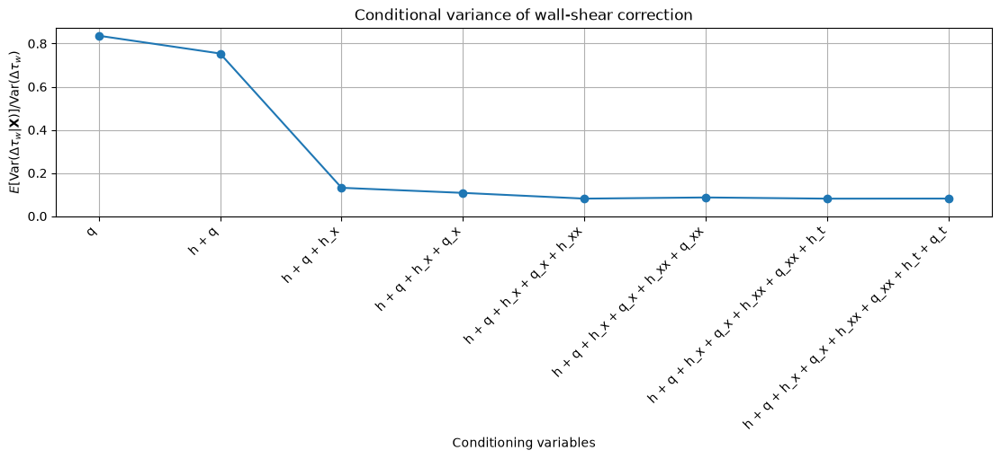

In [35]:
labels = [" + ".join(features) for features in conditioning_sets]

fig, ax = plt.subplots(figsize=(11, 5), constrained_layout=True)

ax.plot(range(len(labels)), normalized_conditional_variances, marker="o")

ax.set_xticks(range(len(labels)))
ax.set_xticklabels(labels, rotation=45, ha="right")

ax.set_ylabel(r"$E[\mathrm{Var}(\Delta\tau_w|\mathbf{X})]/\mathrm{Var}(\Delta\tau_w)$")
ax.set_xlabel("Conditioning variables")

ax.set_title("Conditional variance of wall-shear correction")

ax.set_ylim(bottom=0)
ax.grid(True)

plt.show()

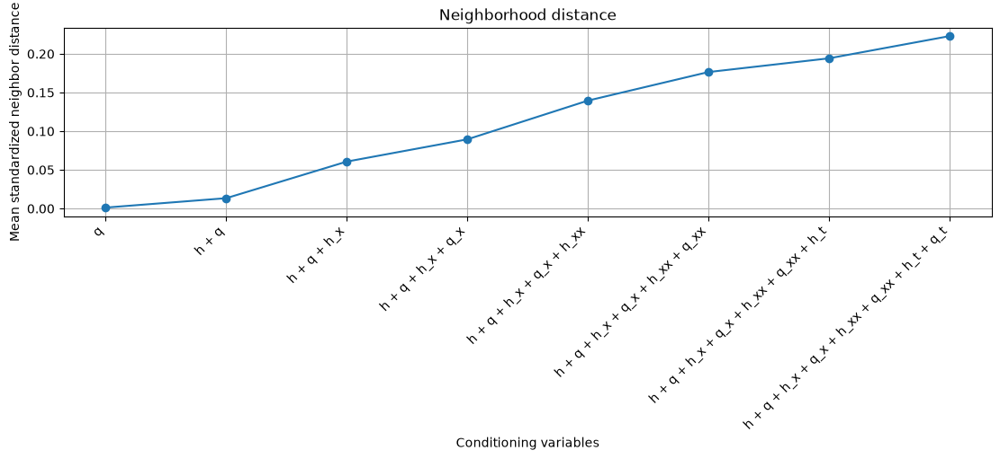

In [36]:
fig, ax = plt.subplots(figsize=(11, 5), constrained_layout=True)

ax.plot(range(len(labels)), mean_neighbor_distances, marker="o")

ax.set_xticks(range(len(labels)))
ax.set_xticklabels(labels, rotation=45, ha="right")

ax.set_ylabel("Mean standardized neighbor distance")
ax.set_xlabel("Conditioning variables")

ax.set_title("Neighborhood distance")

ax.grid(True)

plt.show()

Conditional variance with spatial data instead of spatial derivatives

In [37]:
spatial_widths = [0, 1, 2, 4, 8]

spatial_datasets = {}

for k_space in spatial_widths:

    X_cases = []
    Y_cases = []

    for case_name, data in all_closure_data.items():

        h = data["h"]
        q = data["q"]
        tau_w = data["tau_wall"]

        analysis_mask = analysis_masks[case_name]

        nx, nt = h.shape

        tau_w_correction = tau_w - 3.0 * q / h**2

        center_indices = np.arange(k_space, nx - k_space)

        feature_arrays = []

        for offset in range(-k_space, k_space + 1):
            feature_arrays.append(h[center_indices + offset, :])
            feature_arrays.append(q[center_indices + offset, :])

        X_case = np.stack(feature_arrays, axis=-1)

        Y_case = tau_w_correction[center_indices, :]

        mask_case = analysis_mask[center_indices, :]

        X_case = X_case[mask_case]
        Y_case = Y_case[mask_case]

        valid = np.all(np.isfinite(X_case), axis=1) & np.isfinite(Y_case)

        X_cases.append(X_case[valid])
        Y_cases.append(Y_case[valid])

    X_spatial = np.vstack(X_cases)
    Y_spatial = np.concatenate(Y_cases)

    spatial_datasets[k_space] = {
        "X": X_spatial,
        "Y": Y_spatial,
    }

    print(f"k_space = {k_space:2d}   features = {X_spatial.shape[1]:3d}   samples = {X_spatial.shape[0]}")

k_space =  0   features =   2   samples = 4768762
k_space =  1   features =   6   samples = 4768202
k_space =  2   features =  10   samples = 4767642
k_space =  4   features =  18   samples = 4766522
k_space =  8   features =  34   samples = 4764282


In [38]:
k_neighbors = 30
sample_size = 100000

conditional_variances_spatial = []
normalized_variances_spatial = []
mean_distances_spatial = []

rng = np.random.default_rng(42)

for k_space in spatial_widths:

    X = spatial_datasets[k_space]["X"]
    Y = spatial_datasets[k_space]["Y"]

    if len(Y) > sample_size:
        idx = rng.choice(len(Y), sample_size, replace=False)
        X_sample = X[idx]
        Y_sample = Y[idx]
    else:
        X_sample = X
        Y_sample = Y

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_sample)

    nbrs = NearestNeighbors(n_neighbors=k_neighbors)
    nbrs.fit(X_scaled)

    distances, indices = nbrs.kneighbors(X_scaled)

    neighbor_Y = Y_sample[indices]

    local_variance = np.var(neighbor_Y, axis=1)

    mean_conditional_variance = np.mean(local_variance)
    total_variance = np.var(Y_sample)
    normalized_variance = mean_conditional_variance / total_variance

    mean_distance = np.mean(distances[:, 1:])

    conditional_variances_spatial.append(mean_conditional_variance)
    normalized_variances_spatial.append(normalized_variance)
    mean_distances_spatial.append(mean_distance)

    print(f"k_space = {k_space:2d}   features = {X_sample.shape[1]:3d}   normalized variance = {normalized_variance:.4f}   distance = {mean_distance:.4f}")

k_space =  0   features =   2   normalized variance = 0.7538   distance = 0.0134
k_space =  1   features =   6   normalized variance = 0.2509   distance = 0.0300
k_space =  2   features =  10   normalized variance = 0.1872   distance = 0.0432
k_space =  4   features =  18   normalized variance = 0.1438   distance = 0.0692
k_space =  8   features =  34   normalized variance = 0.1158   distance = 0.1154


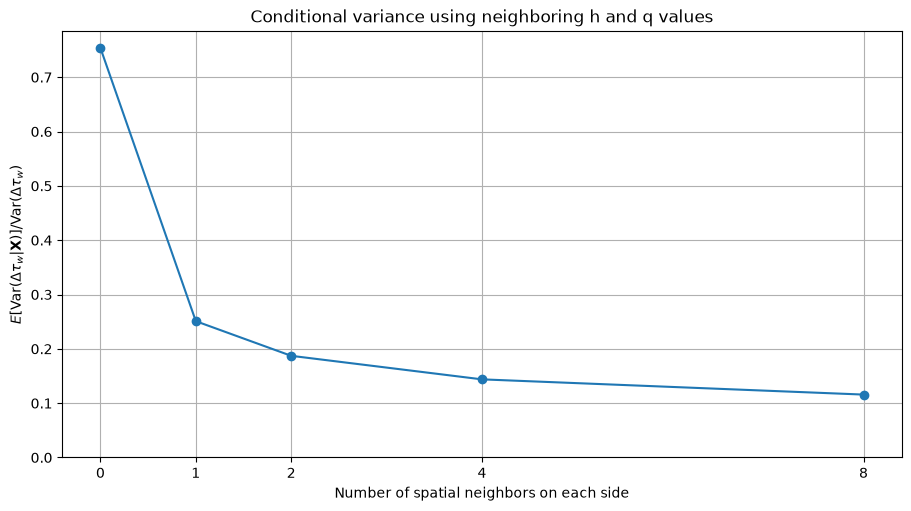

In [39]:
fig, ax = plt.subplots(figsize=(9, 5), constrained_layout=True)

ax.plot(spatial_widths, normalized_variances_spatial, marker="o")

ax.set_xlabel("Number of spatial neighbors on each side")
ax.set_ylabel(r"$E[\mathrm{Var}(\Delta\tau_w|\mathbf{X})]/\mathrm{Var}(\Delta\tau_w)$")
ax.set_title("Conditional variance using neighboring h and q values")
ax.set_xticks(spatial_widths)
ax.set_ylim(bottom=0)
ax.grid(True)

plt.show()

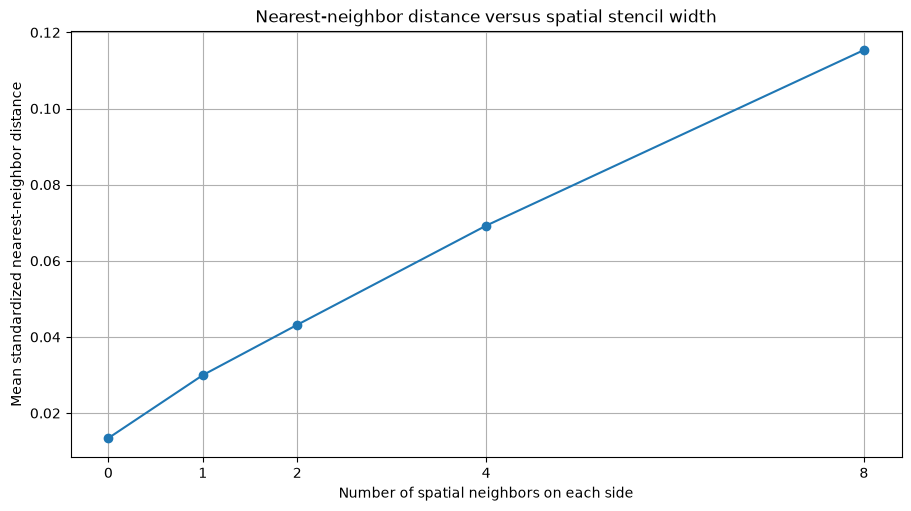

In [40]:
fig, ax = plt.subplots(figsize=(9, 5), constrained_layout=True)

ax.plot(spatial_widths, mean_distances_spatial, marker="o")

ax.set_xlabel("Number of spatial neighbors on each side")
ax.set_ylabel("Mean standardized nearest-neighbor distance")
ax.set_title("Nearest-neighbor distance versus spatial stencil width")
ax.set_xticks(spatial_widths)
ax.grid(True)

plt.show()

In [41]:
for i, (case_name, data) in enumerate(all_closure_data.items()):

    h = data["h"]
    h_x = data["h_x"]
    q = data["q"]
    tau_w = data["tau_wall"]

    analysis_mask = analysis_masks[case_name]

    tau_w_correction = tau_w - 3.0 * q / h**2
    tau_w_error = np.abs(tau_w_correction)

    positive_mask = analysis_mask & (h_x > 0.0)
    negative_mask = analysis_mask & (h_x < 0.0)

    error_positive = tau_w_error[positive_mask]
    error_negative = tau_w_error[negative_mask]

    error_positive = error_positive[np.isfinite(error_positive)]
    error_negative = error_negative[np.isfinite(error_negative)]

In [42]:
for case_name, data in all_closure_data.items():

    h = data["h"]
    h_x = data["h_x"]
    q = data["q"]
    tau_w = data["tau_wall"]

    analysis_mask = analysis_masks[case_name]

    tau_w_error = np.abs(tau_w - 3.0 * q / h**2)

    positive_mask = analysis_mask & (h_x > 0.0)
    negative_mask = analysis_mask & (h_x < 0.0)

    error_positive = tau_w_error[positive_mask]
    error_negative = tau_w_error[negative_mask]

    error_positive = error_positive[np.isfinite(error_positive)]
    error_negative = error_negative[np.isfinite(error_negative)]

    print(case_name)
    print(f"  h_x > 0: mean = {np.mean(error_positive):.4f}, median = {np.median(error_positive):.4f}, std = {np.std(error_positive):.4f}")
    print(f"  h_x < 0: mean = {np.mean(error_negative):.4f}, median = {np.median(error_negative):.4f}, std = {np.std(error_negative):.4f}")

Re010_Ca0_010_theta45_v2
  h_x > 0: mean = 0.1109, median = 0.0504, std = 0.2722
  h_x < 0: mean = 0.3080, median = 0.1433, std = 0.4045
Re050_Ca0_010_theta45
  h_x > 0: mean = 0.3468, median = 0.1008, std = 0.9151
  h_x < 0: mean = 0.8608, median = 0.4443, std = 1.0862
Re120_Ca0_010_theta45
  h_x > 0: mean = 0.3116, median = 0.0823, std = 0.9105
  h_x < 0: mean = 0.6369, median = 0.2071, std = 0.9510


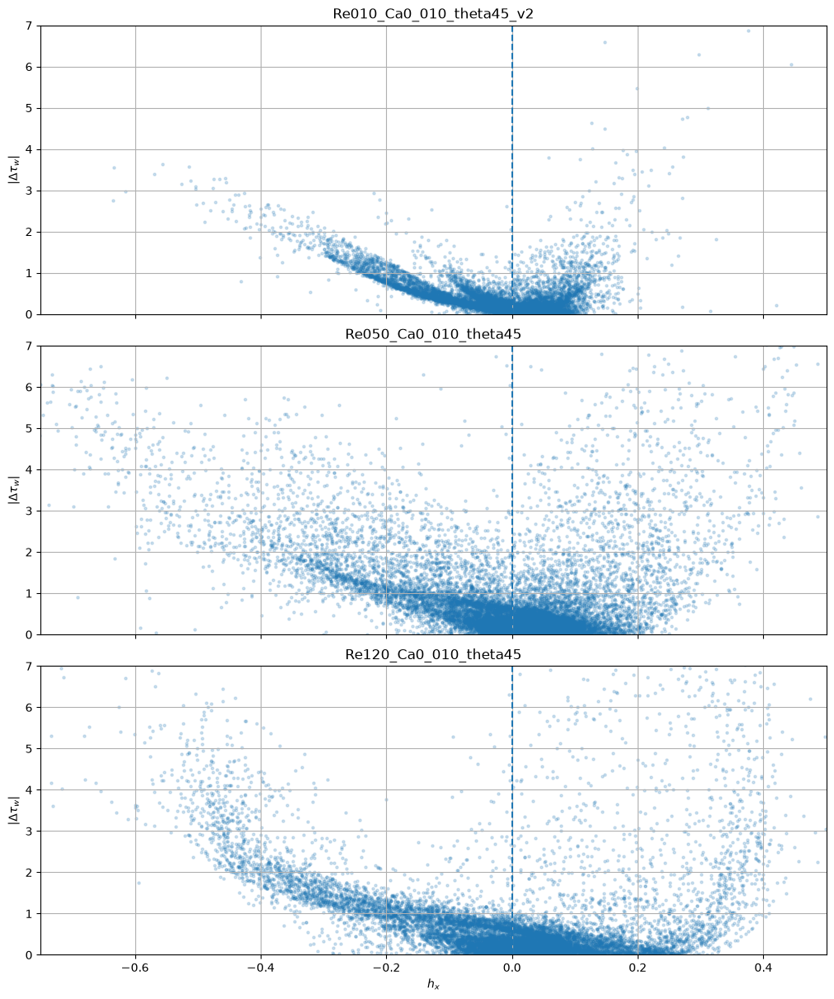

In [43]:
sample_size = 30000
rng = np.random.default_rng(42)

fig, ax = plt.subplots(len(all_closure_data), 1, figsize=(10, 12), sharex=True, constrained_layout=True)

for i, (case_name, data) in enumerate(all_closure_data.items()):

    h = data["h"]
    h_x = data["h_x"]
    q = data["q"]
    tau_w = data["tau_wall"]

    analysis_mask = analysis_masks[case_name]

    tau_w_error = np.abs(tau_w - 3.0 * q / h**2)

    hx_values = h_x[analysis_mask]
    error_values = tau_w_error[analysis_mask]

    valid = np.isfinite(hx_values) & np.isfinite(error_values)

    hx_values = hx_values[valid]
    error_values = error_values[valid]

    if len(hx_values) > sample_size:
        idx = rng.choice(len(hx_values), sample_size, replace=False)
        hx_values = hx_values[idx]
        error_values = error_values[idx]

    ax[i].scatter(hx_values, error_values, s=5, alpha=0.2)
    ax[i].axvline(0.0, linestyle="--")

    ax[i].set_title(case_name)
    ax[i].set_xlim((-0.75,0.5))
    ax[i].set_ylim((0,7))
    ax[i].set_ylabel(r"$|\Delta\tau_w|$")
    ax[i].grid(True)

ax[-1].set_xlabel(r"$h_x$")

plt.show()

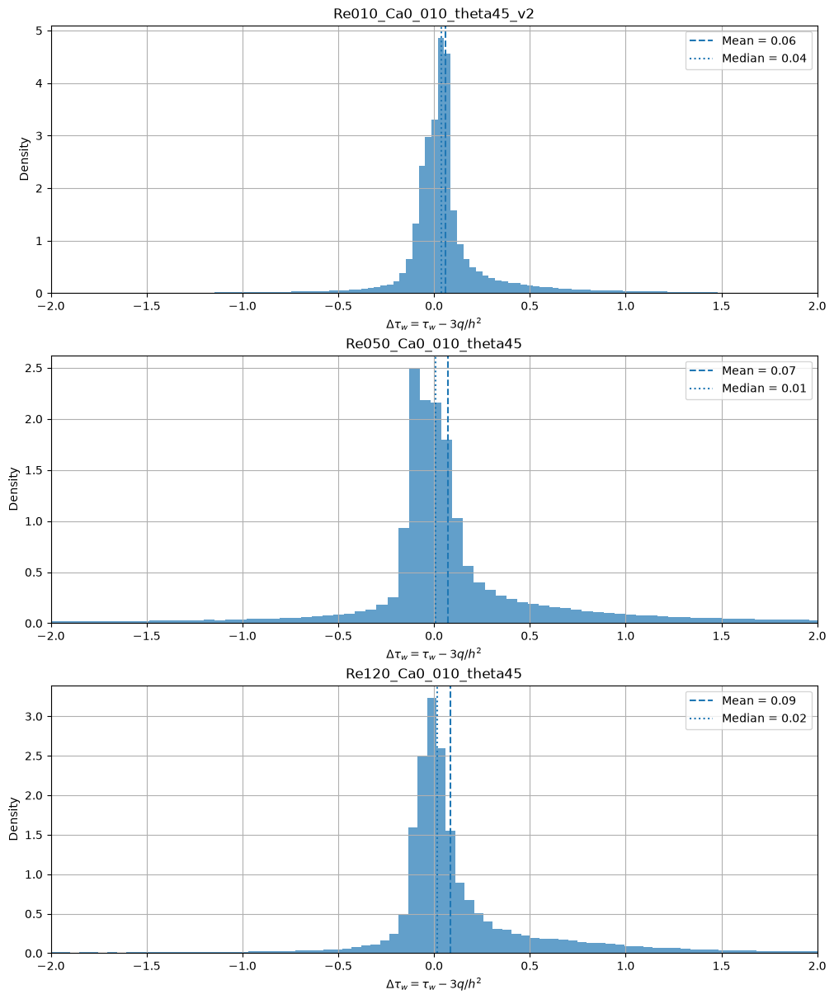

In [44]:
fig, ax = plt.subplots(len(all_closure_data), 1, figsize=(10, 12), sharex=False, constrained_layout=True)

for i, (case_name, data) in enumerate(all_closure_data.items()):

    h = data["h"]
    q = data["q"]
    tau_w = data["tau_wall"]

    analysis_mask = analysis_masks[case_name]

    delta_tau_w = (tau_w - 3.0 * q / h**2)
    delta_tau_w = delta_tau_w[analysis_mask]

    valid = np.isfinite(delta_tau_w)
    delta_tau_w = delta_tau_w[valid]

    ax[i].hist(delta_tau_w, bins=500, density=True, alpha=0.7)

    ax[i].axvline(np.mean(delta_tau_w), linestyle="--", label=f"Mean = {np.mean(delta_tau_w):.2f}")
    ax[i].axvline(np.median(delta_tau_w), linestyle=":", label=f"Median = {np.median(delta_tau_w):.2f}")

    ax[i].set_title(case_name)
    ax[i].set_xlabel(r"$\Delta\tau_w = \tau_w - 3q/h^2$")
    ax[i].set_xlim((-2, 2))
    ax[i].set_ylabel("Density")
    ax[i].grid(True)
    ax[i].legend()

plt.show()

In [45]:
for case_name, data in all_closure_data.items():

    h = data["h"]
    q = data["q"]
    tau_w = data["tau_wall"]

    analysis_mask = analysis_masks[case_name]

    delta_tau_w = tau_w - 3.0 * q / h**2
    delta_tau_w = delta_tau_w[analysis_mask]
    delta_tau_w = delta_tau_w[np.isfinite(delta_tau_w)]

    print(case_name)
    print(f"  N      = {len(delta_tau_w)}")
    print(f"  Min    = {np.min(delta_tau_w):.4f}")
    print(f"  Max    = {np.max(delta_tau_w):.4f}")
    print(f"  Mean   = {np.mean(delta_tau_w):.4f}")
    print(f"  Median = {np.median(delta_tau_w):.4f}")
    print(f"  Std    = {np.std(delta_tau_w):.4f}")
    print(f"  P01    = {np.percentile(delta_tau_w, 1):.4f}")
    print(f"  P99    = {np.percentile(delta_tau_w, 99):.4f}")
    print()

Re010_Ca0_010_theta45_v2
  N      = 3059110
  Min    = -9.1545
  Max    = 7.4651
  Mean   = 0.0593
  Median = 0.0366
  Std    = 0.3764
  P01    = -1.0813
  P99    = 1.3837

Re050_Ca0_010_theta45
  N      = 1473256
  Min    = -17.3969
  Max    = 10.8159
  Mean   = 0.0725
  Median = 0.0084
  Std    = 1.1197
  P01    = -4.1064
  P99    = 3.6694

Re120_Ca0_010_theta45
  N      = 236396
  Min    = -15.4930
  Max    = 9.0409
  Mean   = 0.0854
  Median = 0.0176
  Std    = 1.0270
  P01    = -4.3917
  P99    = 3.3206



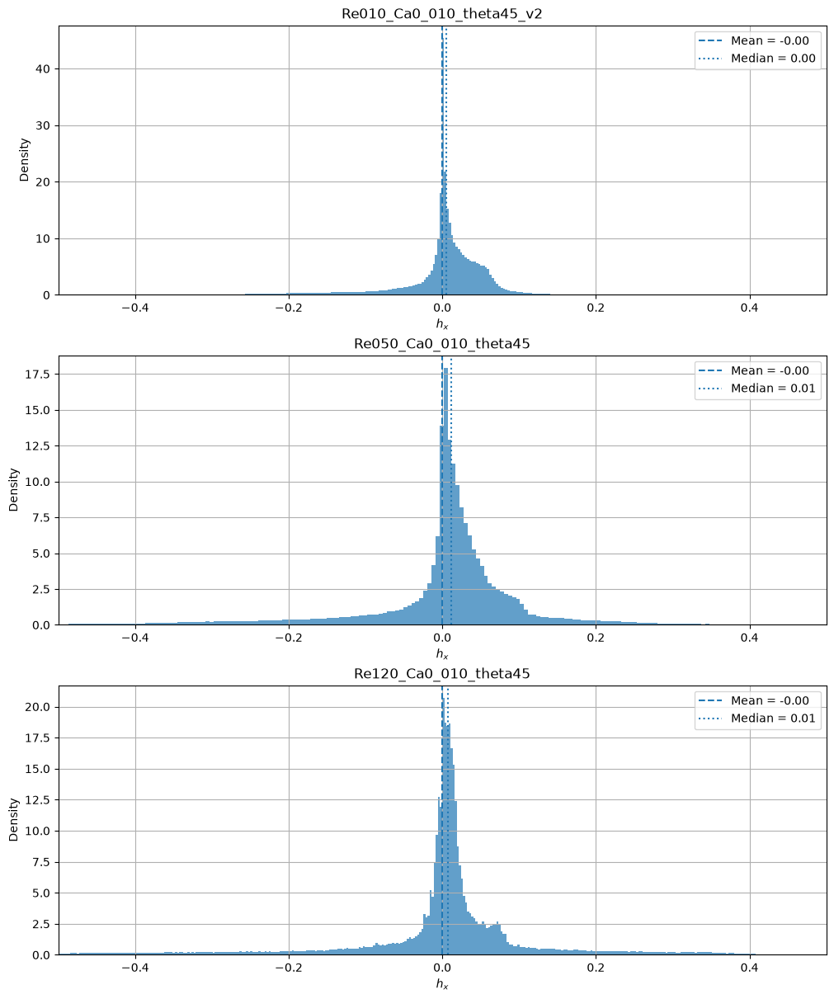

In [46]:
fig, ax = plt.subplots(len(all_closure_data), 1, figsize=(10, 12), sharex=False, constrained_layout=True)

for i, (case_name, data) in enumerate(all_closure_data.items()):

    plot_data = data["h_x"]
    
    analysis_mask = analysis_masks[case_name]

    
    plot_data = plot_data[analysis_mask]

    valid = np.isfinite(plot_data)
    plot_data = plot_data[valid]

    ax[i].hist(plot_data, bins=500, density=True, alpha=0.7)

    ax[i].axvline(np.mean(plot_data), linestyle="--", label=f"Mean = {np.mean(plot_data):.2f}")
    ax[i].axvline(np.median(plot_data), linestyle=":", label=f"Median = {np.median(plot_data):.2f}")

    ax[i].set_title(case_name)
    ax[i].set_xlabel(r"$h_x$")
    ax[i].set_xlim((-0.5, 0.5))
    ax[i].set_ylabel("Density")
    ax[i].grid(True)
    ax[i].legend()

plt.show()

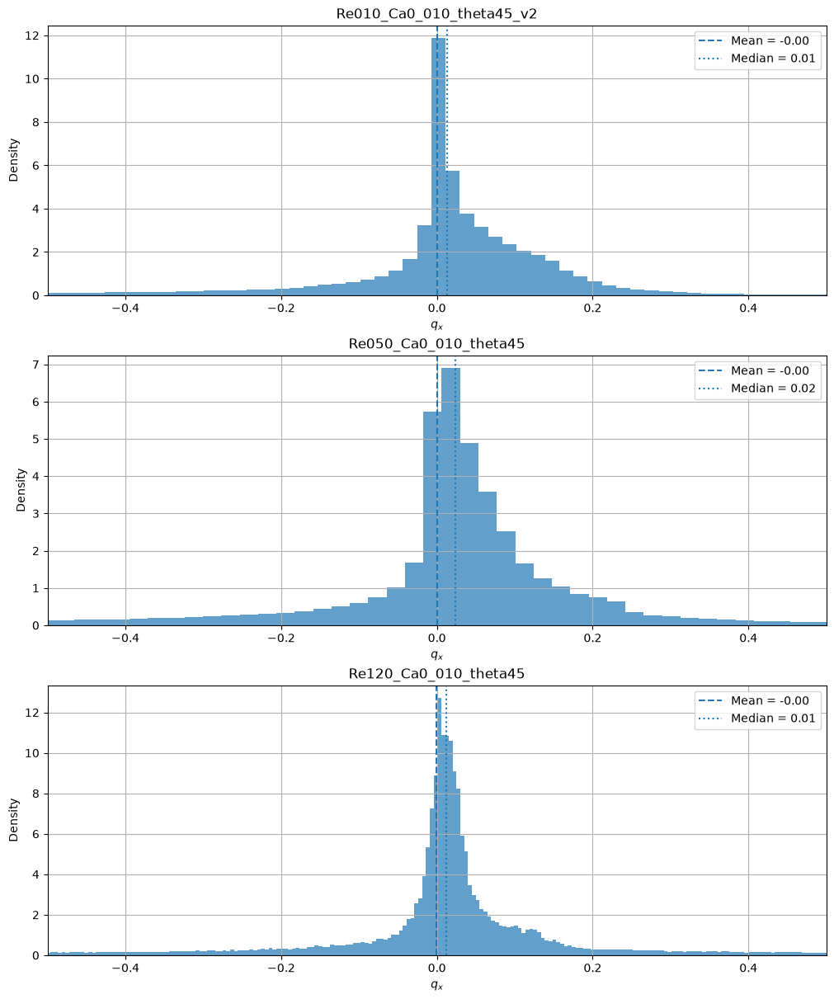

In [47]:
fig, ax = plt.subplots(len(all_closure_data), 1, figsize=(10, 12), sharex=False, constrained_layout=True)

for i, (case_name, data) in enumerate(all_closure_data.items()):

    plot_data = data["q_x"]
    
    analysis_mask = analysis_masks[case_name]

    
    plot_data = plot_data[analysis_mask]

    valid = np.isfinite(plot_data)
    plot_data = plot_data[valid]

    ax[i].hist(plot_data, bins=500, density=True, alpha=0.7)

    ax[i].axvline(np.mean(plot_data), linestyle="--", label=f"Mean = {np.mean(plot_data):.2f}")
    ax[i].axvline(np.median(plot_data), linestyle=":", label=f"Median = {np.median(plot_data):.2f}")

    ax[i].set_title(case_name)
    ax[i].set_xlabel(r"$q_x$")
    ax[i].set_xlim((-0.5, 0.5))
    ax[i].set_ylabel("Density")
    ax[i].grid(True)
    ax[i].legend()

plt.show()

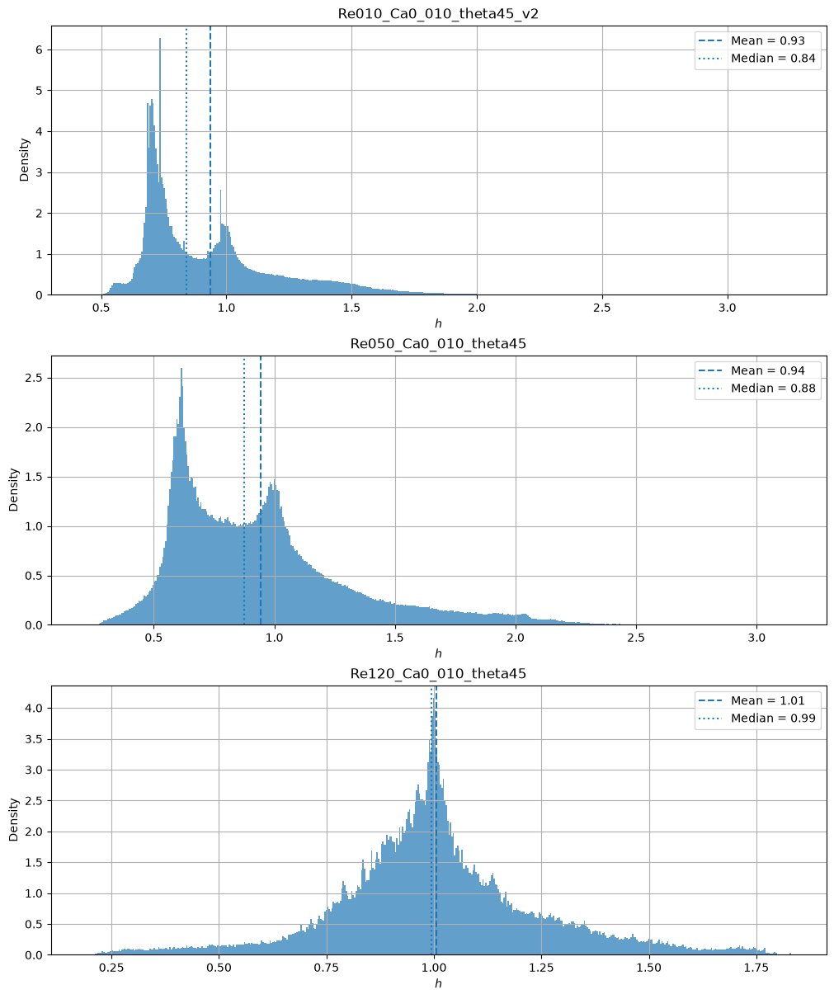

In [48]:
fig, ax = plt.subplots(len(all_closure_data), 1, figsize=(10, 12), sharex=False, constrained_layout=True)

for i, (case_name, data) in enumerate(all_closure_data.items()):

    plot_data = data["h"]
    
    analysis_mask = analysis_masks[case_name]

    
    plot_data = plot_data[analysis_mask]

    valid = np.isfinite(plot_data)
    plot_data = plot_data[valid]

    ax[i].hist(plot_data, bins=500, density=True, alpha=0.7)

    ax[i].axvline(np.mean(plot_data), linestyle="--", label=f"Mean = {np.mean(plot_data):.2f}")
    ax[i].axvline(np.median(plot_data), linestyle=":", label=f"Median = {np.median(plot_data):.2f}")

    ax[i].set_title(case_name)
    ax[i].set_xlabel(r"$h$")
    # ax[i].set_xlim((-0.5, 0.5))
    ax[i].set_ylabel("Density")
    ax[i].grid(True)
    ax[i].legend()

plt.show()

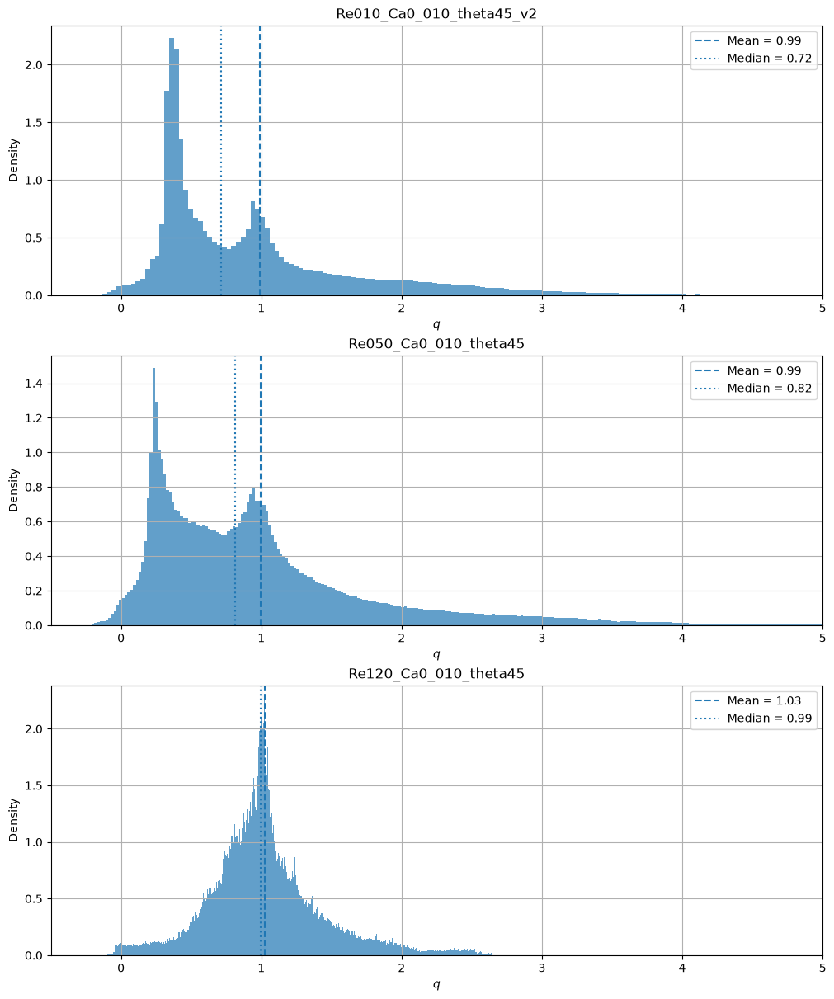

In [49]:
fig, ax = plt.subplots(len(all_closure_data), 1, figsize=(10, 12), sharex=False, constrained_layout=True)

for i, (case_name, data) in enumerate(all_closure_data.items()):

    plot_data = data["q"]
    
    analysis_mask = analysis_masks[case_name]

    
    plot_data = plot_data[analysis_mask]

    valid = np.isfinite(plot_data)
    plot_data = plot_data[valid]

    ax[i].hist(plot_data, bins=500, density=True, alpha=0.7)

    ax[i].axvline(np.mean(plot_data), linestyle="--", label=f"Mean = {np.mean(plot_data):.2f}")
    ax[i].axvline(np.median(plot_data), linestyle=":", label=f"Median = {np.median(plot_data):.2f}")

    ax[i].set_title(case_name)
    ax[i].set_xlabel(r"$q$")
    ax[i].set_xlim((-0.5, 5))
    ax[i].set_ylabel("Density")
    ax[i].grid(True)
    ax[i].legend()

plt.show()

In [50]:
for case_name, data in all_closure_data.items():

    h = data["h"]
    q = data["q"]
    h_x = data["h_x"]
    q_x = data["q_x"]
    h_xx = data["h_xx"]
    q_xx = data["q_xx"]

    analysis_mask = analysis_masks[case_name]

    
    h = h[analysis_mask]
    h = h[np.isfinite(h)]
    q = q[analysis_mask]
    q = q[np.isfinite(q)]
    h_x = h_x[analysis_mask]
    h_x = h_x[np.isfinite(h_x)]
    q_x = q_x[analysis_mask]
    q_x = q_x[np.isfinite(q_x)]
    h_xx = h_xx[analysis_mask]
    h_xx = h_xx[np.isfinite(h_xx)]
    q_xx = q_xx[analysis_mask]
    q_xx = h_xx[np.isfinite(q_xx)]
    
    print(case_name)
    print(f"  h")
    print(f"  Mean   = {np.mean(h):.4f}")
    print(f"  Std    = {np.std(h):.4f}")
    print(f"  P01    = {np.percentile(h, 1):.4f}")
    print(f"  P99    = {np.percentile(h, 99):.4f}")
    print(f"  q")
    print(f"  Mean   = {np.mean(q):.4f}")
    print(f"  Std    = {np.std(q):.4f}")
    print(f"  P01    = {np.percentile(q, 1):.4f}")
    print(f"  P99    = {np.percentile(q, 99):.4f}")
    
    print(f"  h_x")
    print(f"  Mean   = {np.mean(h_x):.4f}")
    print(f"  Std    = {np.std(h_x):.4f}")
    print(f"  P01    = {np.percentile(h_x, 1):.4f}")
    print(f"  P99    = {np.percentile(h_x, 99):.4f}")
    print(f"  q_x")
    print(f"  Mean   = {np.mean(q_x):.4f}")
    print(f"  Std    = {np.std(q_x):.4f}")
    print(f"  P01    = {np.percentile(q_x, 1):.4f}")
    print(f"  P99    = {np.percentile(q_x, 99):.4f}")
    
    print(f"  h_xx")
    print(f"  Mean   = {np.mean(h_xx):.4f}")
    print(f"  Std    = {np.std(h_xx):.4f}")
    print(f"  P01    = {np.percentile(h_xx, 1):.4f}")
    print(f"  P99    = {np.percentile(h_xx, 99):.4f}")
    print(f"  q_xx")
    print(f"  Mean   = {np.mean(q_xx):.4f}")
    print(f"  Std    = {np.std(q_xx):.4f}")
    print(f"  P01    = {np.percentile(q_xx, 1):.4f}")
    print(f"  P99    = {np.percentile(q_xx, 99):.4f}")
    
    print()

Re010_Ca0_010_theta45_v2
  h
  Mean   = 0.9350
  Std    = 0.2867
  P01    = 0.5674
  P99    = 1.8494
  q
  Mean   = 0.9883
  Std    = 0.8877
  P01    = 0.0404
  P99    = 4.2152
  h_x
  Mean   = -0.0001
  Std    = 0.0643
  P01    = -0.2545
  P99    = 0.1164
  q_x
  Mean   = -0.0000
  Std    = 0.1925
  P01    = -0.7471
  P99    = 0.3505
  h_xx
  Mean   = 0.0000
  Std    = 0.1484
  P01    = -0.3652
  P99    = 0.4222
  q_xx
  Mean   = 0.0000
  Std    = 0.1484
  P01    = -0.3652
  P99    = 0.4222

Re050_Ca0_010_theta45
  h
  Mean   = 0.9447
  Std    = 0.3735
  P01    = 0.3945
  P99    = 2.1080
  q
  Mean   = 0.9945
  Std    = 0.8414
  P01    = -0.0024
  P99    = 3.9213
  h_x
  Mean   = -0.0002
  Std    = 0.1185
  P01    = -0.4671
  P99    = 0.2797
  q_x
  Mean   = -0.0001
  Std    = 0.2506
  P01    = -1.0183
  P99    = 0.5942
  h_xx
  Mean   = 0.0000
  Std    = 0.1630
  P01    = -0.3544
  P99    = 0.6542
  q_xx
  Mean   = 0.0000
  Std    = 0.1630
  P01    = -0.3544
  P99    = 0.6542

Re120_

In [51]:
for case_name, data in all_closure_data.items():
    h_xx = data["h_xx"]
    q_xx = data["q_xx"]

    print(case_name)
    print("Exactly equal:", np.array_equal(h_xx, q_xx))
    print("Max difference:", np.max(np.abs(h_xx - q_xx)))

Re010_Ca0_010_theta45_v2
Exactly equal: False
Max difference: 80.30125367080544
Re050_Ca0_010_theta45
Exactly equal: False
Max difference: 134.58554917111422
Re120_Ca0_010_theta45
Exactly equal: False
Max difference: 32.70522767146785
